In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from os import listdir
from os.path import isfile, join
import imutils


image = 1
mypath = '../data/imagesprojets5/photo/'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

In [4]:
onlyfiles

['image_1_1.jpg',
 'image_1_2.jpg',
 'image_1_3.jpg',
 'image_2_1.jpg',
 'image_2_2.jpg',
 'image_2_3.jpg',
 'image_2_4.jpg',
 'image_2_5.jpg',
 'image_3_1.jpg']

In [5]:
img_file = onlyfiles[4]
origin_file = '../data/imagesprojets5/originals/image_1.jpg' 

In [6]:
img = cv2.imread(mypath + img_file)
origin = cv2.imread(origin_file)

Text(0.5, 1.0, 'origin image')

<Figure size 720x720 with 0 Axes>

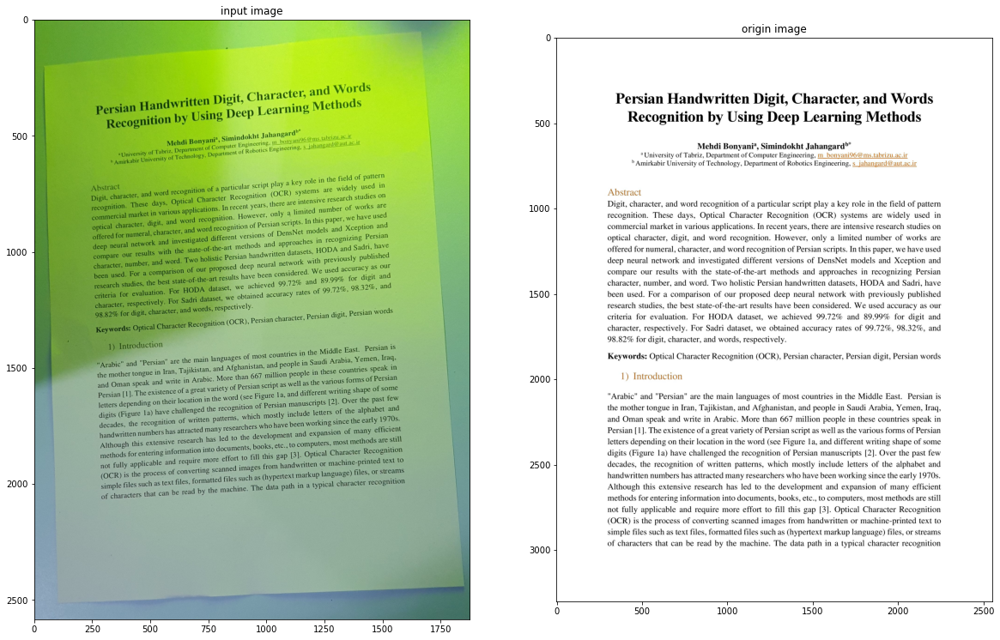

In [7]:
plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(img)
ax1.set_title('input image')
ax2.imshow(origin)
ax2.set_title('origin image')

Text(0.5, 1.0, 'result_norm_planes')

<Figure size 720x720 with 0 Axes>

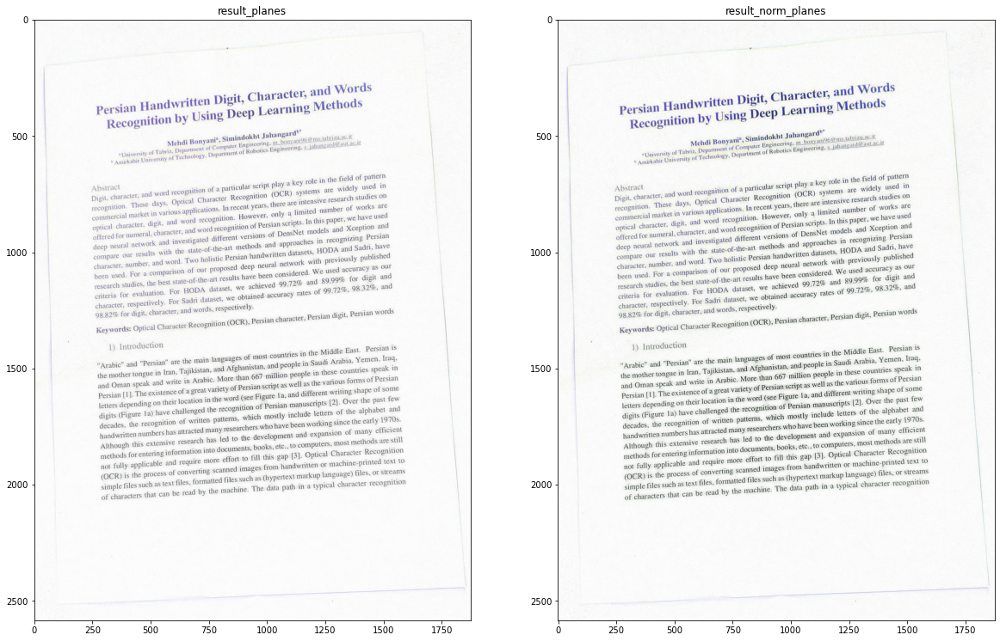

In [8]:

rgb_planes = cv2.split(img)

result_planes = []
result_norm_planes = []
for plane in rgb_planes:
    dilated_img = cv2.dilate(plane, np.ones((7,7), np.uint8))
    bg_img = cv2.medianBlur(dilated_img, 21)
    diff_img = 255 - cv2.absdiff(plane, bg_img)
    norm_img = cv2.normalize(diff_img,None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
    result_planes.append(diff_img)
    result_norm_planes.append(norm_img)

result = cv2.merge(result_planes)
result_norm = cv2.merge(result_norm_planes)

plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(result)
ax1.set_title('result_planes')
ax2.imshow(result_norm)
ax2.set_title('result_norm_planes')

In [9]:
# convert to grayscale
gray = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)

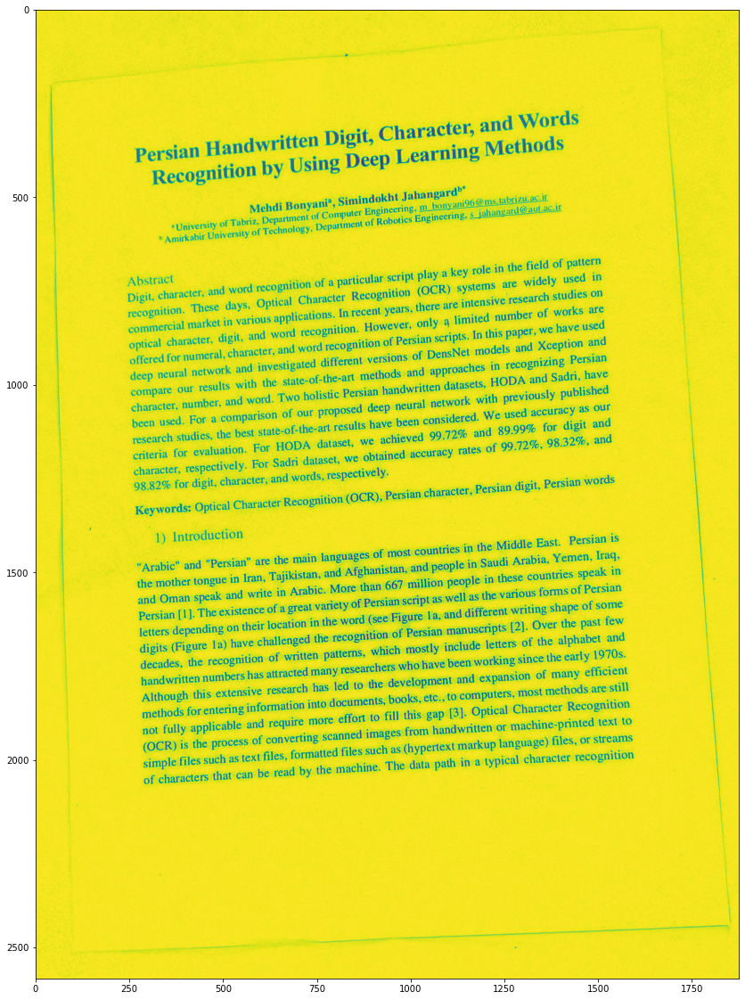

In [10]:
plt.imshow(gray)

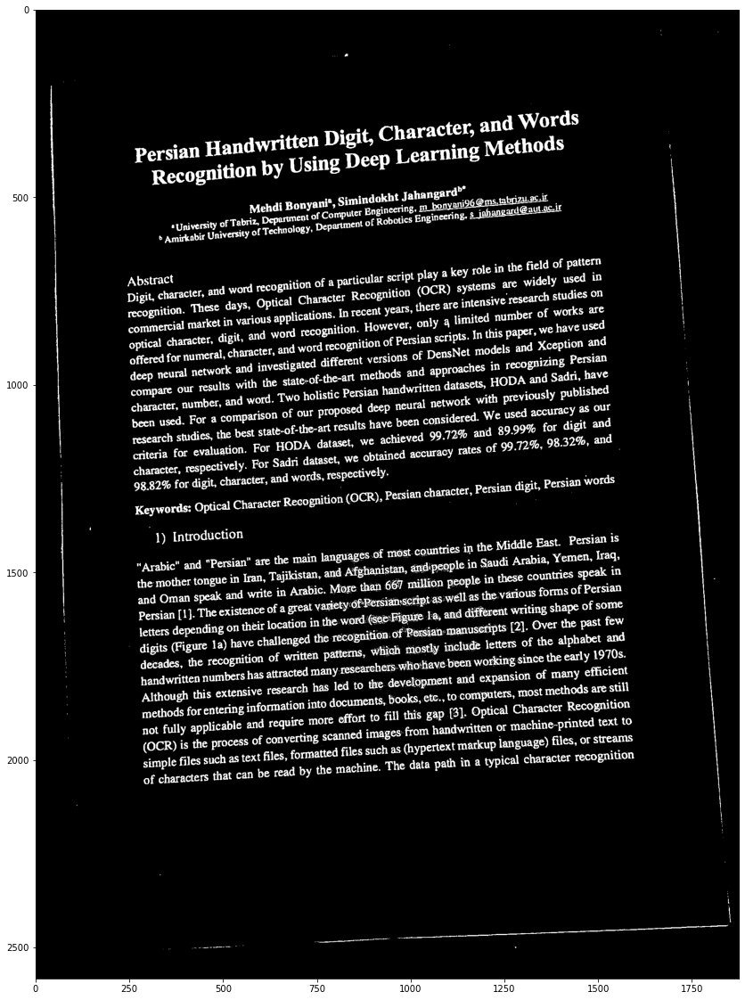

In [11]:
# create a binary thresholded image
_, binary = cv2.threshold(gray, 225, 255, cv2.THRESH_BINARY_INV)
# show it
plt.imshow(binary, cmap="gray")
plt.show()

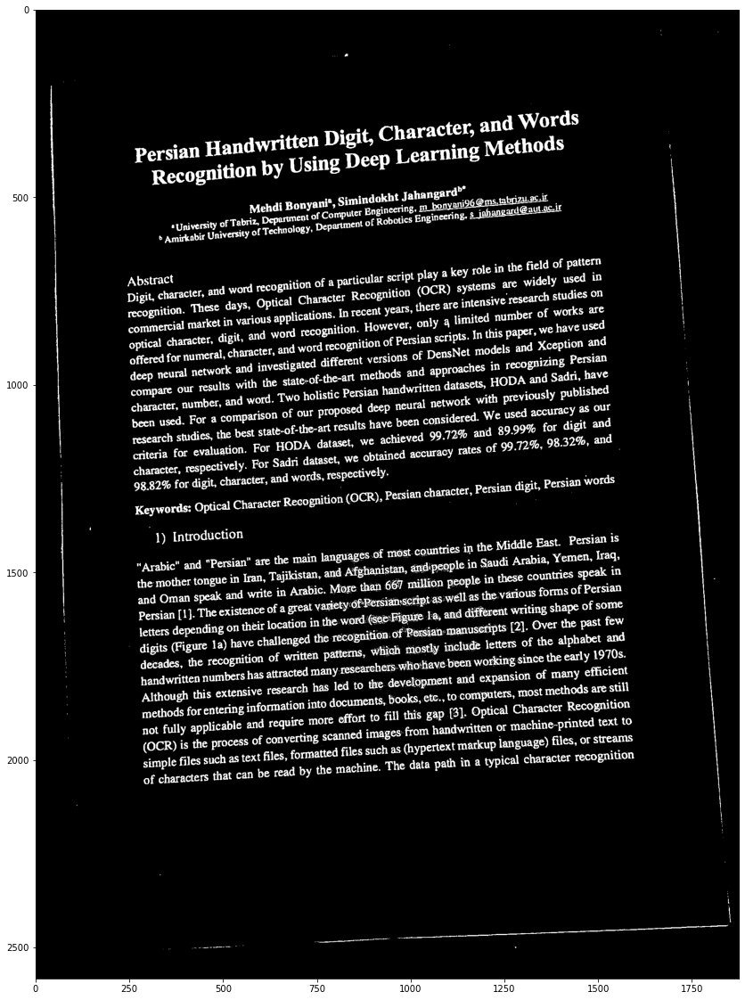

In [12]:
# create a binary thresholded image
_, binary = cv2.threshold(gray, 225, 255, cv2.THRESH_BINARY_INV)
# show it
plt.imshow(binary, cmap="gray")
plt.show()

In [13]:
# find the contours from the thresholded image
contours, hierarchy = cv2.findContours(binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# draw all contours
image = cv2.drawContours(result, contours, -1, (0, 255, 0), 2)

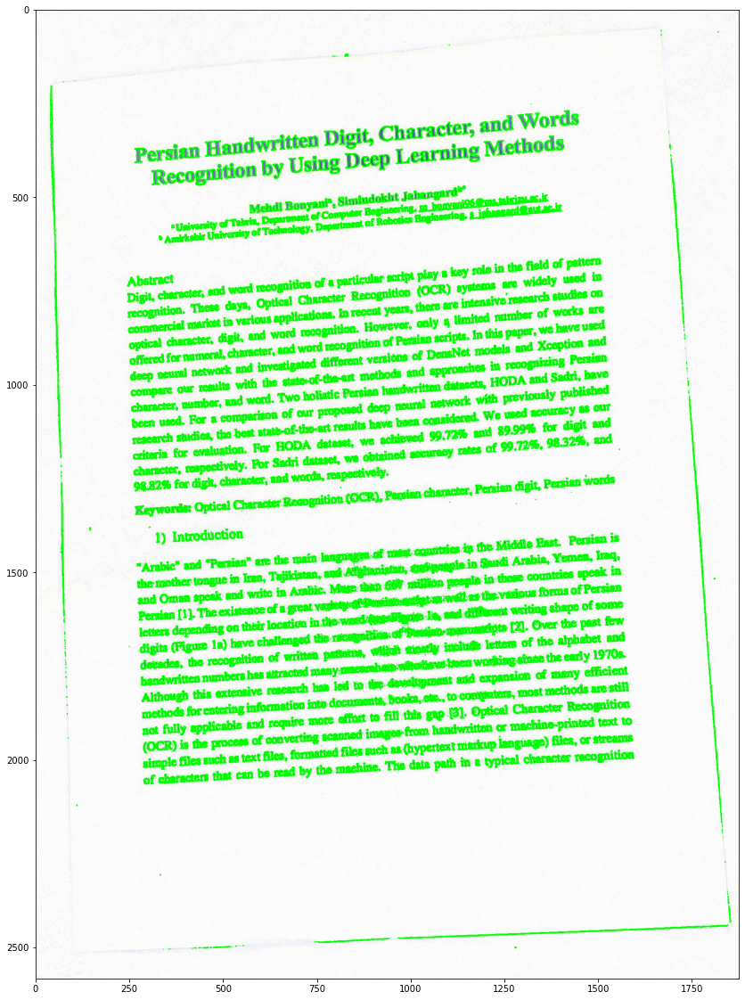

In [14]:
# show the image with the drawn contours
plt.imshow(image)
plt.show()

In [15]:
img = result.copy()
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

kernel_size = 5
blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size),0)

In [16]:
low_threshold = 50
high_threshold = 150
edges = cv2.Canny(blur_gray, low_threshold, high_threshold)

In [17]:
rho = 1  # distance resolution in pixels of the Hough grid
theta = np.pi / 180  # angular resolution in radians of the Hough grid
threshold = 15  # minimum number of votes (intersections in Hough grid cell)
min_line_length = 50  # minimum number of pixels making up a line
max_line_gap = 20  # maximum gap in pixels between connectable line segments
line_image = np.copy(img) * 0  # creating a blank to draw lines on

# Run Hough on edge detected image
# Output "lines" is an array containing endpoints of detected line segments
lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]),
                    min_line_length, max_line_gap)

for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)

In [18]:
# Draw the lines on the  image
lines_edges = cv2.addWeighted(img, 0.8, line_image, 1, 0)

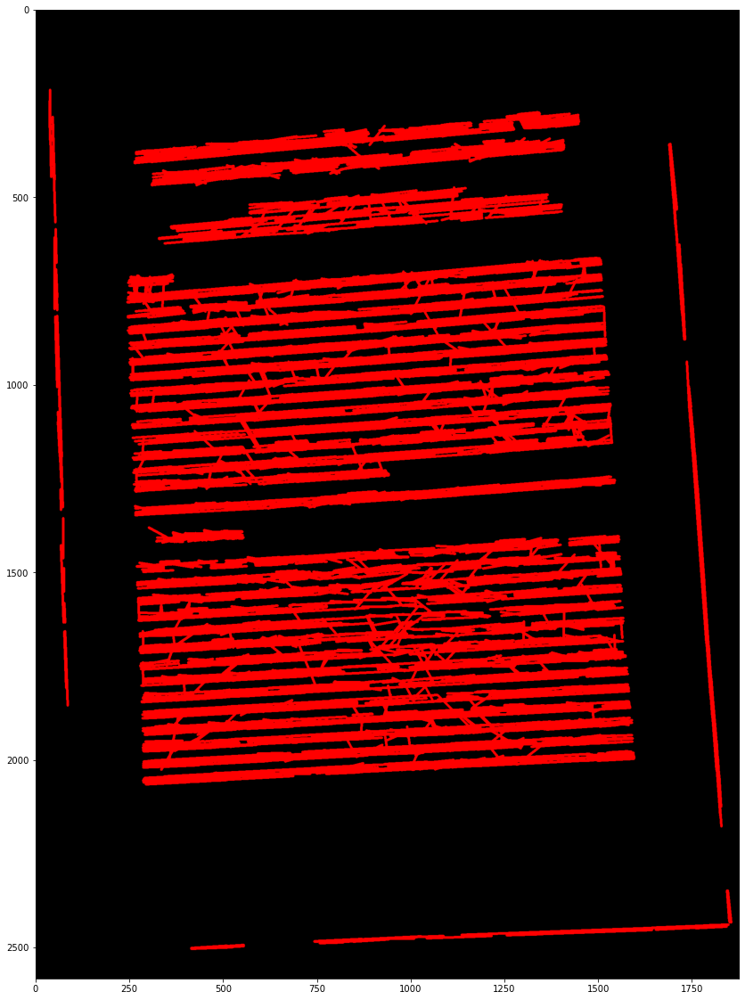

In [19]:
plt.imshow(line_image)

In [19]:
line_image.shape

(2583, 1875, 3)

In [20]:
lines.shape

(3204, 1, 4)

In [21]:
lines_r = lines.reshape(3204,4)

In [22]:
lines_r[0:10]

array([[1288, 1814, 1577, 1799],
       [ 886,  510,  894,  578],
       [ 334, 2026,  375, 1958],
       [ 680, 1936, 1187, 1909],
       [1017, 1064, 1063, 1001],
       [1421, 1428, 1552, 1419],
       [1774, 1514, 1797, 1829],
       [  53,  586,   55,  676],
       [ 842, 1249,  894, 1185],
       [ 300, 1071, 1079, 1017]], dtype=int32)

### solution one (partial):
- find the highest vector direction in the image, it will correspond to the text in the image.
- rotate it so that it becomes horizontal
- crop the image in the areas where the lines with the corresponding direction end + a buffer.

In [141]:
# angles = []
# angles_with_no_inf = []
# for line in lines:
#     for x1,y1,x2,y2 in line:
#         angle = (y2-y1)/(x2-x1)
#         if abs(angle) != np.inf:
#             angles_with_no_inf.append(angle)
#         angles.append(angle)
# angles = np.array(angles)
# angles_with_no_inf = np.array(angles_with_no_inf)

<ipython-input-141-ab36314d1280>:5: RuntimeWarning: divide by zero encountered in int_scalars
  angle = (y2-y1)/(x2-x1)


In [142]:
# angles_mean = angles_with_no_inf.mean()

In [145]:
# angle_perc_difference = (angles - angles_mean)/angles_mean
# angle_perc__with_no_inf_difference = (angles_with_no_inf - angles_mean)/angles_mean


<AxesSubplot:ylabel='Density'>

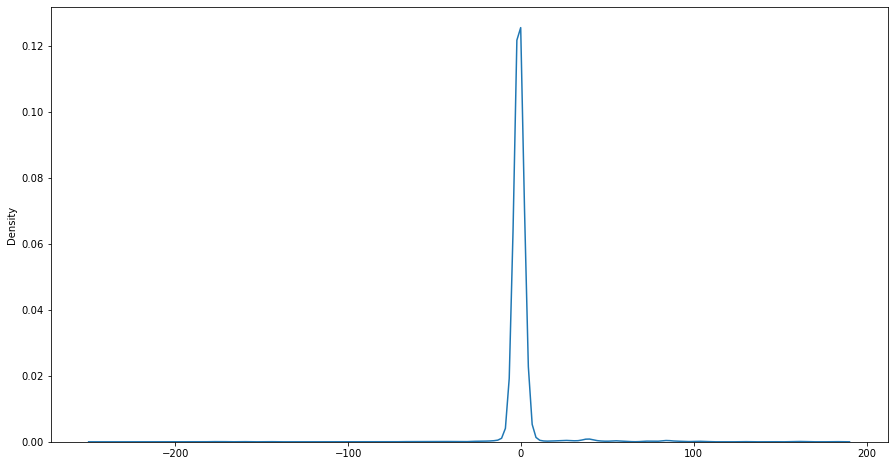

In [146]:
# import seaborn as sns
# plt.figure(figsize=(15,8))
# sns.kdeplot(angle_perc__with_no_inf_difference)

In [140]:
# angle_perc_difference.shape

(3198,)

### Solution 2 
- Find the highest vector direction 
- find the image contours with auto-completion
- compute the homography matrix
- apply the homography transformation on the image

In [23]:
from skimage import io
from skimage.transform import rotate
from skimage.color import rgb2gray
from deskew import determine_skew

In [24]:
def deskew(_img):
    #image = io.imread(_img)
    grayscale = rgb2gray(_img)
    angle = determine_skew(grayscale)
    rotated = rotate(_img, angle, resize=True) * 255
    print(angle)
    return angle,rotated.astype(np.uint8)

In [25]:
def display_avant_apres(_original):
    plt.subplot(1, 2, 1)
    plt.imshow(_original)
    plt.subplot(1, 2, 2)
    plt.imshow(deskew(_original)[1])

In [26]:
angle_desk,rotated  = deskew(result)

-3.519553072625712


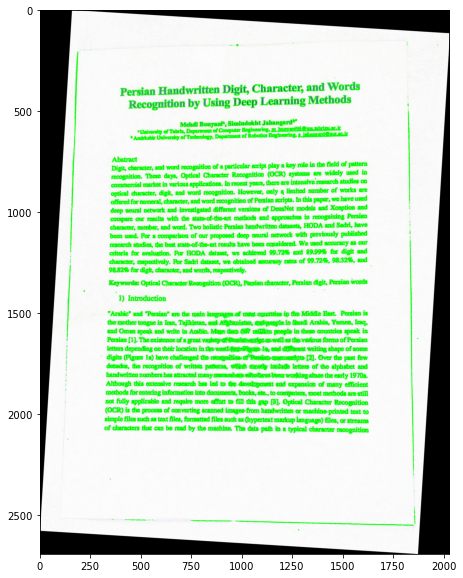

In [27]:
plt.figure(figsize = (15,10))
plt.imshow(rotated)

In [28]:
angle_desk

-3.519553072625712

In [284]:
rho = 1  # distance resolution in pixels of the Hough grid
theta = np.pi / 180  # angular resolution in radians of the Hough grid
threshold = 15  # minimum number of votes (intersections in Hough grid cell)
min_line_length = 50  # minimum number of pixels making up a line
max_line_gap = 20  # maximum gap in pixels between connectable line segments
line_image = np.copy(img) * 0  # creating a blank to draw lines on

# Run Hough on edge detected image
# Output "lines" is an array containing endpoints of detected line segments
lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]),
                    min_line_length, max_line_gap)
# lines_ang = cv2.HoughLines(edges,1,theta,200)


In [285]:
# removing small lines
lines_tmp = []
for line in lines : 
    for x1,y1,x2,y2 in line : 
        if abs(x2-x1)>10:
            lines_tmp.append(np.array([[x1,y1,x2,y2]]))
lines_tmp = np.array(lines_tmp)
lines = lines.copy()

In [286]:
# computing angles
angles = []
for line in lines : 
    for x1,y1,x2,y2 in line:
        ang = np.arctan((x1-x2)/(y2-y1))
        angles.append(ang)
angles = np.array(angles)

<ipython-input-286-8e2a21003f05>:5: RuntimeWarning: divide by zero encountered in int_scalars
  ang = np.arctan((x1-x2)/(y2-y1))


In [287]:
#converting angles to degree
angles_deg = np.rad2deg(angles)

In [288]:
# adjusting angles (from deskew repo)
rot_angles = []
for angle in angles_deg:
    if 0 <= angle <= 90:
        rot_angle = angle - 90
    elif -45 <= angle < 0:
        rot_angle = angle - 90
    elif -90 <= angle < -45:
        rot_angle = 90 + angle
    rot_angles.append(rot_angle)
rot_angles = np.array(rot_angles)

<AxesSubplot:ylabel='Count'>

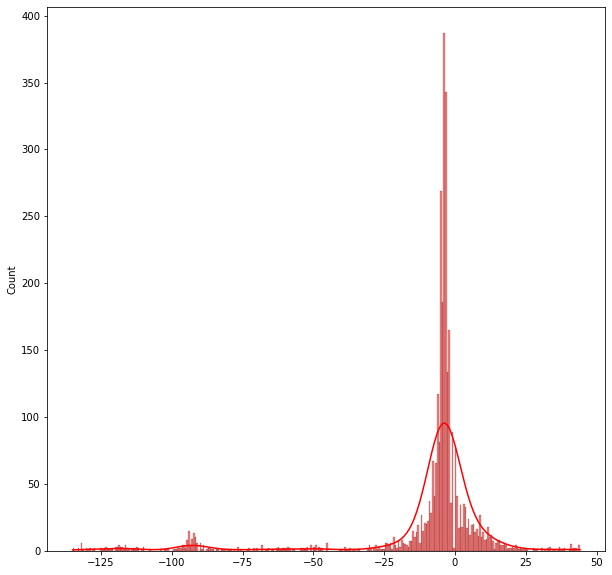

In [289]:
plt.figure(figsize=(10,10))
sns.histplot(rot_angles,kde=True,color='r')

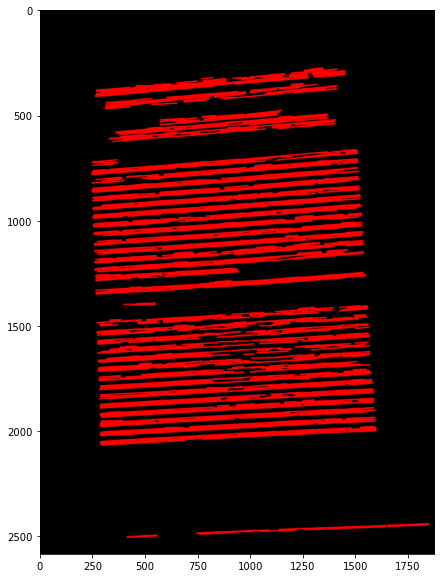

In [290]:
# filtering and only keeping lines with the same angle
thresh = 5
lines_r = lines.reshape(lines.shape[0],4)
mask = (rot_angles>=angle_desk-abs(angle_desk))*(rot_angles<=angle_desk+abs(angle_desk))
lines_candidates = lines_r[mask,:]


lines_candidates = lines_candidates.reshape(lines_candidates.shape[0],1,lines_candidates.shape[1])
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
for line in lines_candidates:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,0,0),5)
plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

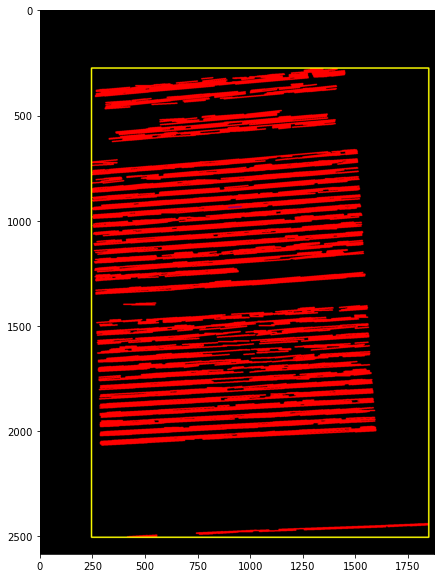

In [291]:
# plotting image with rectangular contour
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
absis = [] #compute the absis of each line
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,0,0),5)
        b = y2 - x2*(y2-y1)/(x2-x1)

        absis.append(b)
absis = np.array(absis)

x1,y1,x2,y2 = lines_candidates[-1][0]
cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128,0,128),5)


# perfect rectangle 
lines_candidates_r = lines_candidates.reshape(lines_candidates.shape[0],4)
x = np.concatenate([lines_candidates_r[:,0],lines_candidates_r[:,2]])
y = np.concatenate([lines_candidates_r[:,1],lines_candidates_r[:,3]])
x_max      = x.max()
x_max_arg  = x.argmax()%lines_candidates_r.shape[0]
x_min      = x.min()
x_min_arg  = x.argmin()%lines_candidates_r.shape[0]

y_max      = y.max()
y_max_arg  = y.argmax()%lines_candidates_r.shape[0]
y_min      = y.min()
y_min_arg  = y.argmin()%lines_candidates_r.shape[0]

cv2.line(line_image_candidates,(x_min,y_min),(x_max,y_min),(255,255,0),5)
cv2.line(line_image_candidates,(x_min,y_max),(x_max,y_max),(255,255,0),5)
cv2.line(line_image_candidates,(x_min,y_min),(x_min,y_max),(255,255,0),5)
cv2.line(line_image_candidates,(x_max,y_min),(x_max,y_max),(255,255,0),5)


plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

### Dropping outlier lines

In [300]:
from sklearn.ensemble import IsolationForest
X_train = lines_candidates[:,:,3]
clf = IsolationForest(max_samples=100,contamination=0.01)
clf.fit(X_train)
labels = clf.predict(X_train)

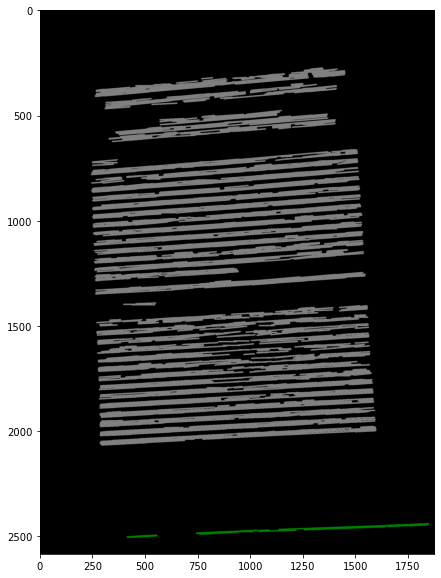

In [301]:
# removing outliers 
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
absis = [] #compute the absis of each line
i = 0
colors = {-1:(0,128,0),0:(128,128,0),1:(128,128,128)}
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        c = labels[i]
        if c in colors.keys():
            cv2.line(line_image_candidates,(x1,y1),(x2,y2),colors[c],5)
        else:
            cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,255,255),5)
            
            
        b = y2 - x2*(y2-y1)/(x2-x1)
    
        absis.append(b)
    i+=1
absis = np.array(absis)
plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

In [274]:
# unique, counts = np.unique(labels, return_counts=True)

In [317]:
#drop outliers
lines_candidates = lines_candidates[labels!=-1]

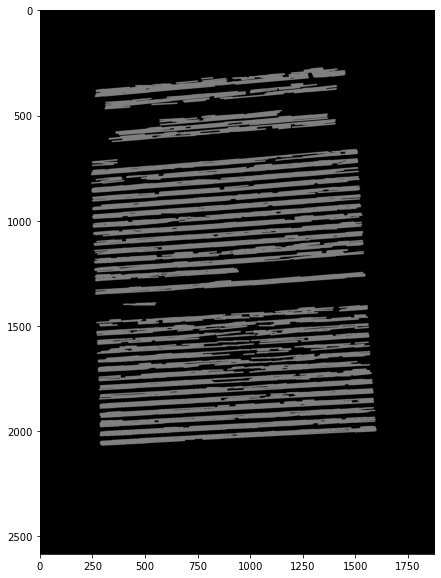

In [319]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        if c in colors.keys():
            cv2.line(line_image_candidates,(x1,y1),(x2,y2),colors[c],5)
        else:
            cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,255,255),5)
plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)          
            

#### If image skewed to left

In [320]:
L = img.shape[0]

lines_candidates_r = lines_candidates.reshape(lines_candidates.shape[0],4)
x1_max_arg,y1_max_arg,x2_max_arg,y2_max_arg = lines_candidates_r.argmax(axis = 0)
x1_min_arg,y1_min_arg,x2_min_arg,y2_min_arg = lines_candidates_r.argmin(axis = 0)

In [321]:
#top right : 
top_right_line = lines_candidates_r[y2_min_arg,:]
x_top_right =top_right_line[2]
y_top_right = top_right_line[3]
def compute_line_equation(l):
    x1,y1,x2,y2 = l
    y1 = L - y1 # inverse y axis to start from 0 to L 
    y2 = L - y2
    
    a = (y2-y1)/(x2-x1)
    b = y2 - x2*a
    return a,b
a,b = compute_line_equation(top_right_line)  

# get top left from the intersection of the top right line with the x_min axis
x_top_left = lines_candidates_r[x1_min_arg,:][0]
y_top_left = int(L-(a*x_top_left + b))

print('top right',x_top_right,y_top_right)
print('top left',x_top_left,y_top_left)


top right 1338 275
top left 244 380


In [325]:
# low right: has x_max
low_right_line = lines_candidates_r[x2_max_arg,:]
x_low_right = low_right_line[2]
y_low_right = low_right_line[3]

a,b = compute_line_equation(low_right_line)  
y_low_left = lines_candidates_r[y1_max_arg,:][1]

x_min = lines_candidates_r.min(axis = 0)[0]

x_low_left = max(x_min,int((L-y_low_left-b)/a))

print('low right',x_low_right,y_low_right)
print('low left',x_low_left,y_low_left)


low right 1594 1992
low left 244 2065


In [326]:
rot_angle

-3.814074834290352

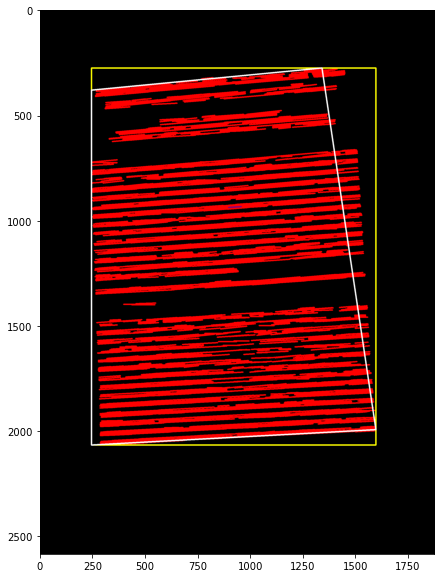

In [327]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
absis = [] #compute the absis of each line
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,0,0),5)
        b = y2 - x2*(y2-y1)/(x2-x1)

        absis.append(b)
absis = np.array(absis)

x1,y1,x2,y2 = lines_candidates[-1][0]
cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128,0,128),5)


# perfect rectangle 
lines_candidates_r = lines_candidates.reshape(lines_candidates.shape[0],4)
x = np.concatenate([lines_candidates_r[:,0],lines_candidates_r[:,2]])
y = np.concatenate([lines_candidates_r[:,1],lines_candidates_r[:,3]])
x_max      = x.max()
x_max_arg  = x.argmax()%lines_candidates_r.shape[0]
x_min      = x.min()
x_min_arg  = x.argmin()%lines_candidates_r.shape[0]

y_max      = y.max()
y_max_arg  = y.argmax()%lines_candidates_r.shape[0]
y_min      = y.min()
y_min_arg  = y.argmin()%lines_candidates_r.shape[0]

cv2.line(line_image_candidates,(x_min,y_min),(x_max,y_min),(255,255,0),5)
cv2.line(line_image_candidates,(x_min,y_max),(x_max,y_max),(255,255,0),5)
cv2.line(line_image_candidates,(x_min,y_min),(x_min,y_max),(255,255,0),5)
cv2.line(line_image_candidates,(x_max,y_min),(x_max,y_max),(255,255,0),5)

cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_low_left,y_low_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_top_right,y_top_right),(x_top_left,y_top_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_top_right,y_top_right),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_left,y_low_left),(x_top_left,y_top_left),(255,255,255),5)


plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

#### Get longest lines

In [392]:
def compute_distance(l):
    return np.sqrt((l[0]-l[2])**2+(l[1]-l[3])**2)
distances = np.apply_along_axis(compute_distance, 1, lines_candidates_r)

index_sorting = np.argsort(distances)
sorted_distances = np.array(sorted(distances))

max_index = (sorted_distances[sorted_distances >= np.percentile(sorted_distances,80)]).shape[0]
longest_lines_indexs = index_sorting[-max_index:]
longest_lines = lines_candidates[longest_lines_indexs,:,:]

In [407]:
colors[c]

(128, 128, 128)

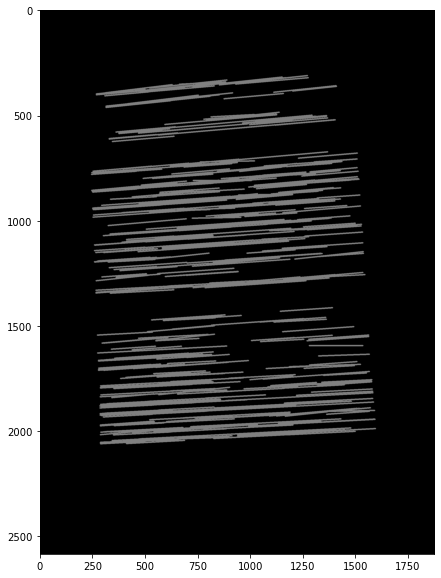

In [408]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
for line in longest_lines[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128, 128, 128),5)
plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)          
            

## Finding the top right corner 

In [496]:
#### Draw the line on the right going through all edges
# for each y2 of a line, there is no other line with x2 higher

# find line with x2 maximum take it and drop it and only keep lines with y2 lower than its y 
# repeat from the list until there is no other line 

candidates = []
lines = lines_candidates_r.copy()

while len(lines)>0:

    first_line = lines[lines.argmax(axis=0)[2],:]
    candidates.append(first_line)
    y = first_line[3]
    lines = lines[lines[:,3]<y]
# lines = np.delete(arr, 1, 0)

In [497]:
candidates = np.array(candidates).reshape(len(candidates),1,4)

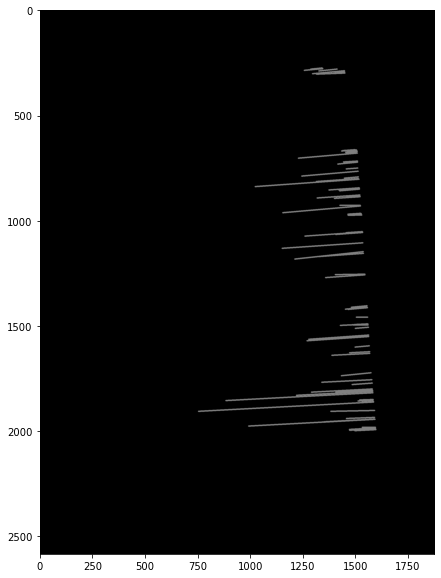

In [498]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
for line in candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128, 128, 128),5)
plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)          
            

Now we fit a robust linear regression to the edges of these points in order to remove outliers (text in the middle of the image)

In [506]:
from sklearn.linear_model import RANSACRegressor

X = candidates[:,:,2]
Y = candidates[:,:,3]

model = RANSACRegressor()
model.fit(X, Y)
y_pred = model.predict(X).astype(int)

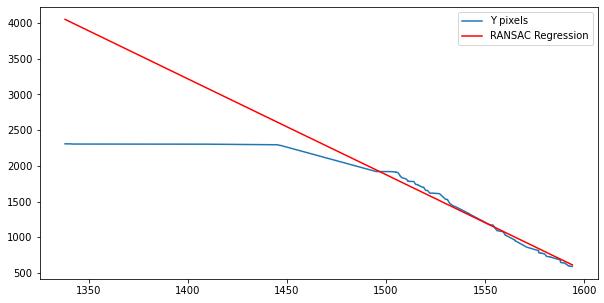

In [507]:
plt.figure(figsize=(10,5))
plt.plot(candidates[:,:,2],L- candidates[:,:,3],label = 'Y pixels')
plt.plot(X,L-y_pred,label='RANSAC Regression',color = 'red')
plt.legend()

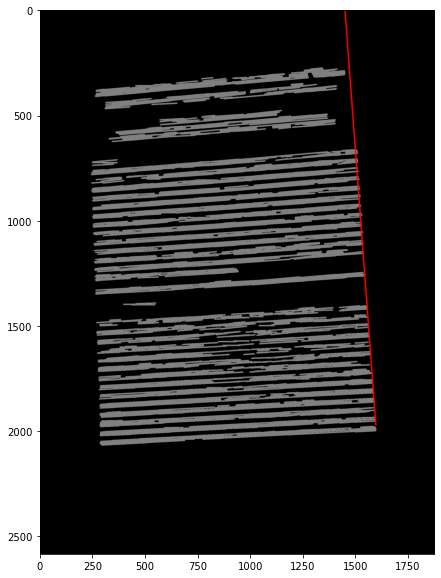

In [508]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128, 128, 128),5)
        
cv2.line(line_image_candidates,(X[0][0],y_pred[0][0]),(X[-1][0],y_pred[-1][0]),(255, 0, 0),5)

plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)          
            

In [509]:
# find line equation of the regression model
model_line = np.array([X[0][0],y_pred[0][0],X[-1][0],y_pred[-1][0]])
a_m,b_m = compute_line_equation(model_line)

# find the line equation of the line with lowest y2

top_right_line = lines_candidates_r[y2_min_arg,:]

a_topright,b_topright = compute_line_equation(top_right_line)  

x_inter = (b_topright-b_m)/(a_m-a_topright)
y_inter = L - int(a_m*x_inter + b_m)
x_inter = int(x_inter)
print('x,y intersection :',x_inter,y_inter)
x_top_right,y_top_right = x_inter,y_inter

x,y intersection : 1466 263


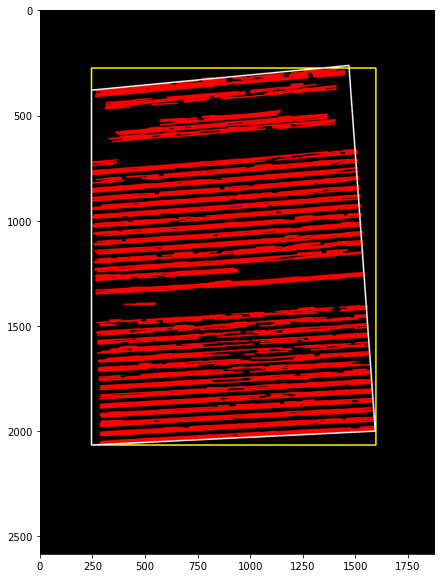

In [510]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
absis = [] #compute the absis of each line
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,0,0),5)
        b = y2 - x2*(y2-y1)/(x2-x1)

        absis.append(b)
absis = np.array(absis)

x1,y1,x2,y2 = lines_candidates[-1][0]
cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128,0,128),5)


# perfect rectangle 
lines_candidates_r = lines_candidates.reshape(lines_candidates.shape[0],4)
x = np.concatenate([lines_candidates_r[:,0],lines_candidates_r[:,2]])
y = np.concatenate([lines_candidates_r[:,1],lines_candidates_r[:,3]])
x_max      = x.max()
x_max_arg  = x.argmax()%lines_candidates_r.shape[0]
x_min      = x.min()
x_min_arg  = x.argmin()%lines_candidates_r.shape[0]

y_max      = y.max()
y_max_arg  = y.argmax()%lines_candidates_r.shape[0]
y_min      = y.min()
y_min_arg  = y.argmin()%lines_candidates_r.shape[0]

cv2.line(line_image_candidates,(x_min,y_min),(x_max,y_min),(255,255,0),5)
cv2.line(line_image_candidates,(x_min,y_max),(x_max,y_max),(255,255,0),5)
cv2.line(line_image_candidates,(x_min,y_min),(x_min,y_max),(255,255,0),5)
cv2.line(line_image_candidates,(x_max,y_min),(x_max,y_max),(255,255,0),5)

cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_low_left,y_low_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_top_right,y_top_right),(x_top_left,y_top_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_top_right,y_top_right),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_left,y_low_left),(x_top_left,y_top_left),(255,255,255),5)


plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

## Finding the low right corner 

using the same logic and keeping the same regression line on the left, we find the low right corner which is defined as the intersection of the regression line and the line with y_max

In [511]:
# low right: has x_max
low_right_line = lines_candidates_r[y1_max_arg,:]

a_lowright,b_lowright = compute_line_equation(low_right_line)  

x_inter = (b_lowright-b_m)/(a_m-a_lowright)
y_inter = L - int(a_m*x_inter + b_m)
x_inter = int(x_inter)
print('x,y intersection :',x_inter,y_inter)
x_low_right,y_low_right = x_inter,y_inter

x,y intersection : 1596 1999


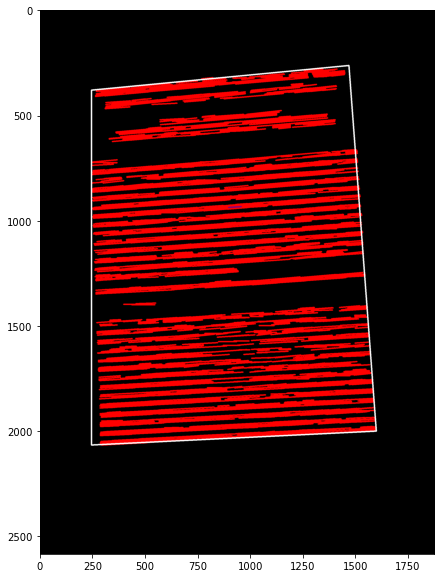

In [512]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
absis = [] #compute the absis of each line
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,0,0),5)
        b = y2 - x2*(y2-y1)/(x2-x1)

        absis.append(b)
absis = np.array(absis)

x1,y1,x2,y2 = lines_candidates[-1][0]
cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128,0,128),5)

cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_low_left,y_low_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_top_right,y_top_right),(x_top_left,y_top_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_top_right,y_top_right),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_left,y_low_left),(x_top_left,y_top_left),(255,255,255),5)


plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

# Left corner : fitting another regression to the left side

In [513]:
#### Draw the line on the left going through all edges
# for each x1 of a line, there is no other line with y_2 lower

# find line with x1 minimal take it and drop it and only keep lines with y2 higher than its y 
# repeat from the list until there is no other line 

candidates = []
lines = lines_candidates_r.copy()

while len(lines)>0:

    first_line = lines[lines.argmin(axis=0)[0],:]
    candidates.append(first_line)
    y = first_line[1]
    lines = lines[lines[:,1]>y]

In [514]:
candidates = np.array(candidates).reshape(len(candidates),1,4)

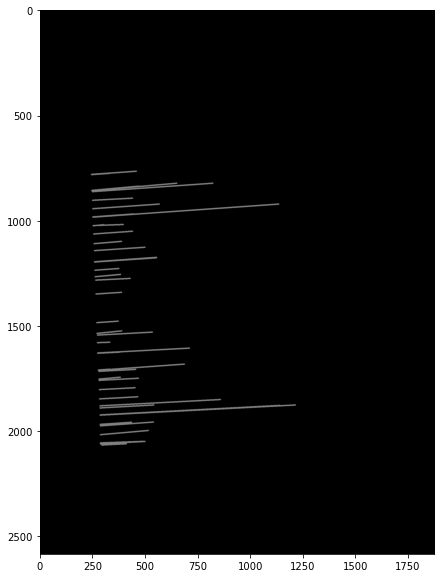

In [515]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
for line in candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128, 128, 128),5)
plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)          
            

In [516]:
from sklearn.linear_model import RANSACRegressor

X = candidates[:,:,0]
Y = candidates[:,:,1]

model = RANSACRegressor()
model.fit(X, Y)
y_pred = model.predict(X).astype(int)

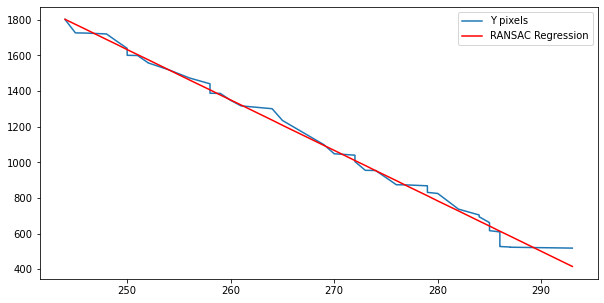

In [517]:
plt.figure(figsize=(10,5))
plt.plot(candidates[:,:,0],L- candidates[:,:,1],label = 'Y pixels')
plt.plot(X,L-y_pred,label='RANSAC Regression',color = 'red')
plt.legend()

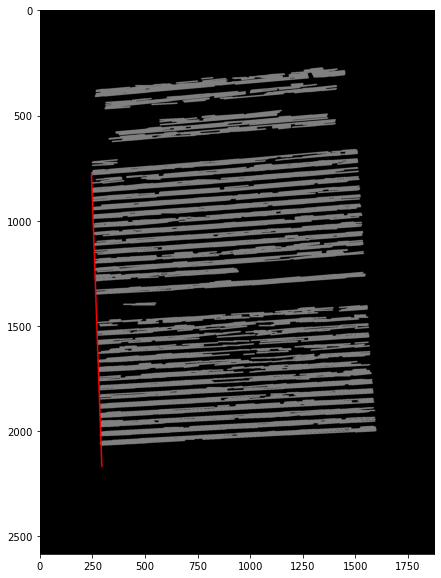

In [518]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128, 128, 128),5)
        
cv2.line(line_image_candidates,(X[0][0],y_pred[0][0]),(X[-1][0],y_pred[-1][0]),(255, 0, 0),5)

plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)          
            

### Top left corner : intersection of regression model and line with the lowest y_2

In [519]:
# find line equation of the regression model
model_line = np.array([X[0][0],y_pred[0][0],X[-1][0],y_pred[-1][0]])
a_m,b_m = compute_line_equation(model_line)

# top left: has y2 min
top_left_line = lines_candidates_r[y2_min_arg,:]

a_topleft,b_top_left = compute_line_equation(top_left_line)  

x_inter = (b_top_left-b_m)/(a_m-a_topleft)
y_inter = L - int(a_m*x_inter + b_m)
x_inter = int(x_inter)
print('x,y intersection :',x_inter,y_inter)
x_top_left,y_top_left = x_inter,y_inter

x,y intersection : 229 382


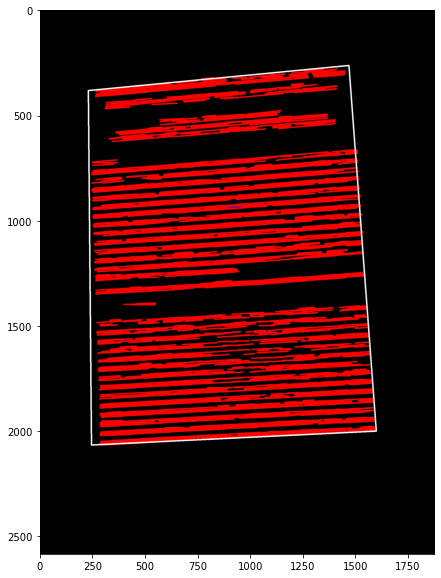

In [520]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
absis = [] #compute the absis of each line
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,0,0),5)
        b = y2 - x2*(y2-y1)/(x2-x1)

        absis.append(b)
absis = np.array(absis)

x1,y1,x2,y2 = lines_candidates[-1][0]
cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128,0,128),5)

cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_low_left,y_low_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_top_right,y_top_right),(x_top_left,y_top_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_top_right,y_top_right),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_left,y_low_left),(x_top_left,y_top_left),(255,255,255),5)


plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

### Low left corner : intersection of regression model and line with the highest y1

In [521]:
# low right: has x_max
low_left_line = lines_candidates_r[y1_max_arg,:]

a_lowleft,b_lowleft = compute_line_equation(low_left_line)  

x_inter = (b_lowleft-b_m)/(a_m-a_lowleft)
y_inter = L - int(a_m*x_inter + b_m)
x_inter = int(x_inter)
print('x,y intersection :',x_inter,y_inter)
x_low_left,y_low_left = x_inter,y_inter

x,y intersection : 289 2066


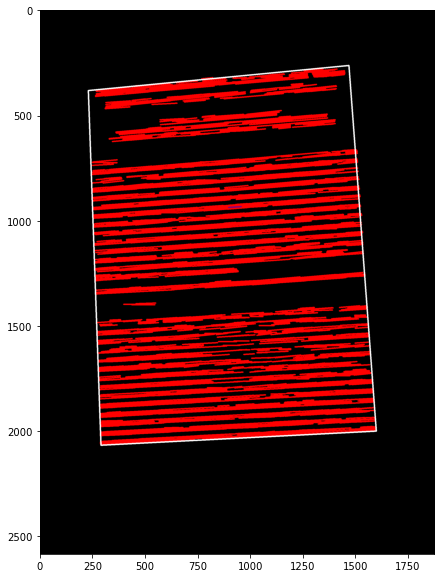

In [522]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
absis = [] #compute the absis of each line
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,0,0),5)
        b = y2 - x2*(y2-y1)/(x2-x1)

        absis.append(b)
absis = np.array(absis)

x1,y1,x2,y2 = lines_candidates[-1][0]
cv2.line(line_image_candidates,(x1,y1),(x2,y2),(128,0,128),5)

cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_low_left,y_low_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_top_right,y_top_right),(x_top_left,y_top_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_top_right,y_top_right),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_left,y_low_left),(x_top_left,y_top_left),(255,255,255),5)


plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

## Adjusting the image 

Now that we have the four corners of our text, we will use these points to redress the image into a rectangular shape using the homography transformation

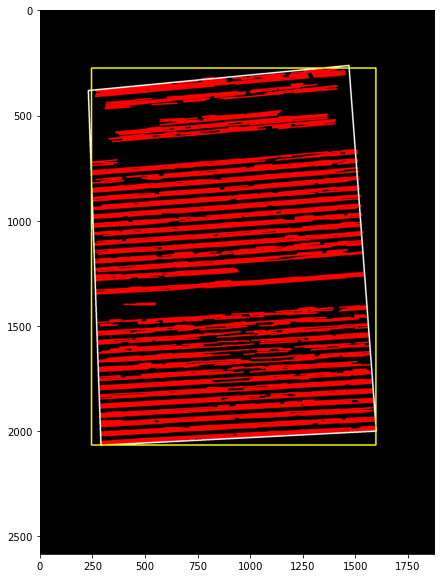

In [525]:
line_image_candidates = np.copy(img) * 0  # creating a blank to draw lines on
for line in lines_candidates[:]:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image_candidates,(x1,y1),(x2,y2),(255,0,0),5)
        
cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_low_left,y_low_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_top_right,y_top_right),(x_top_left,y_top_left),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_right,y_low_right),(x_top_right,y_top_right),(255,255,255),5)
cv2.line(line_image_candidates,(x_low_left,y_low_left),(x_top_left,y_top_left),(255,255,255),5)


# perfect rectangle 
lines_candidates_r = lines_candidates.reshape(lines_candidates.shape[0],4)
x = np.concatenate([lines_candidates_r[:,0],lines_candidates_r[:,2]])
y = np.concatenate([lines_candidates_r[:,1],lines_candidates_r[:,3]])
x_max      = x.max()
x_max_arg  = x.argmax()%lines_candidates_r.shape[0]
x_min      = x.min()
x_min_arg  = x.argmin()%lines_candidates_r.shape[0]

y_max      = y.max()
y_max_arg  = y.argmax()%lines_candidates_r.shape[0]
y_min      = y.min()
y_min_arg  = y.argmin()%lines_candidates_r.shape[0]

cv2.line(line_image_candidates,(x_min,y_min),(x_max,y_min),(255,255,0),5)
cv2.line(line_image_candidates,(x_min,y_max),(x_max,y_max),(255,255,0),5)
cv2.line(line_image_candidates,(x_min,y_min),(x_min,y_max),(255,255,0),5)
cv2.line(line_image_candidates,(x_max,y_min),(x_max,y_max),(255,255,0),5)

plt.figure(figsize=(15,10))
plt.imshow(line_image_candidates)

In [532]:
dest = np.array([(x_min,y_min),
                 (x_min,y_max),
                 (x_max,y_min),
                 (x_max,y_max)
                ])
src =  np.array([(x_top_left,y_top_left),
                 (x_low_left,y_low_left),
                 (x_top_right,y_top_right),
                 (x_low_right,y_low_right)
                ])

In [607]:
h, status = cv2.findHomography(src, dest,cv2.RANSAC, 5.0)
print(h)

[[ 1.15187212e+00 -3.32086462e-02 -2.51822230e+00]
 [ 1.17608785e-01  1.14496685e+00 -1.84153735e+02]
 [ 3.01206766e-05  3.10248827e-05  1.00000000e+00]]


In [609]:
im_out = cv2.warpPerspective(result_norm,h,(result_norm.shape[1], result_norm.shape[0]))

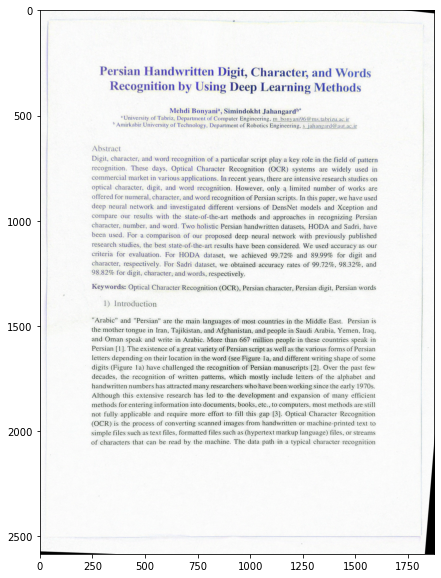

In [610]:
plt.figure(figsize=(15,10))
plt.imshow(im_out)

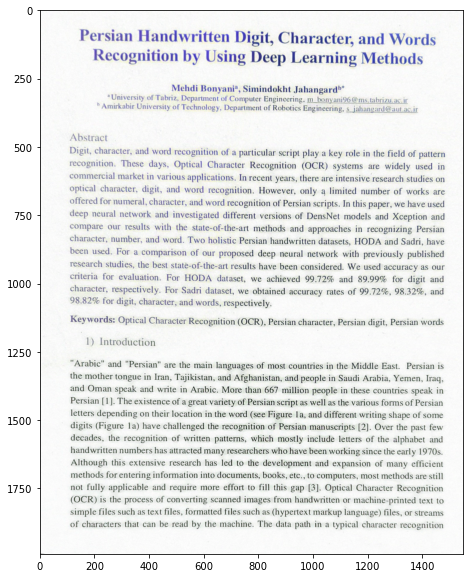

In [613]:
buffer = 100
x_border_min,x_border_max = min(x_top_left,x_low_left,x_top_right,x_low_right)-buffer,max(x_top_left,x_low_left,x_top_right,x_low_right)+buffer
y_border_min,y_border_max = min(y_top_left,y_low_left,y_top_right,y_low_right)-buffer,max(y_top_left,y_low_left,y_top_right,y_low_right)+buffer
# (result_norm.shape[1], result_norm.shape[0])
im_out = cv2.warpPerspective(result_norm[y_border_min:y_border_max,x_border_min:x_border_max],h,(2*buffer + x_max-x_min, 2*buffer + y_max-y_min))
plt.figure(figsize=(15,10))
plt.imshow(im_out)

In [594]:
# print('x_border_min,x_border_max,y_border_min,y_border_max',x_border_min,x_border_max,y_border_min,y_border_max)


In [593]:
# buffer = 50
# x_border_min,x_border_max = min(x_top_left,x_low_left,x_top_right,x_low_right)-buffer,max(x_top_left,x_low_left,x_top_right,x_low_right)+buffer
# y_border_min,y_border_max = min(y_top_left,y_low_left,y_top_right,y_low_right)-buffer,max(y_top_left,y_low_left,y_top_right,y_low_right)+buffer
# print('x_border_min,x_border_max,y_border_min,y_border_max',x_border_min,x_border_max,y_border_min,y_border_max)
# plt.imshow(result_norm[y_border_min:y_border_max,x_border_min:x_border_max])

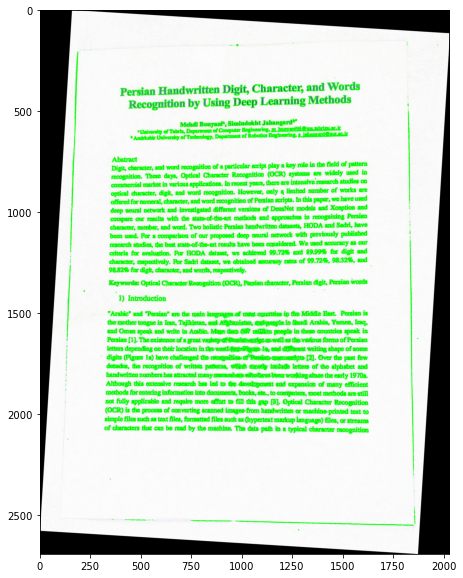

In [595]:
plt.figure(figsize = (15,10))
plt.imshow(rotated)

### Pytesseract : Extract distances 

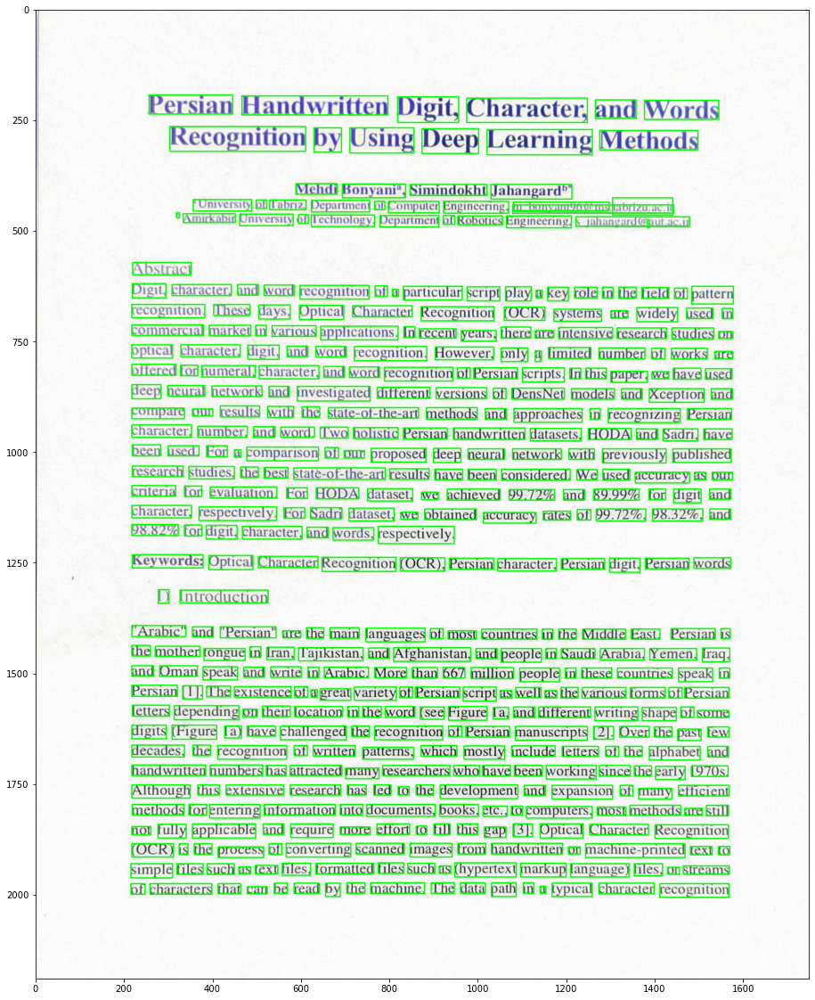

In [596]:
import pytesseract

plt.rcParams["figure.figsize"] = [30,20]

im_tesseract = im_out.copy()
d = pytesseract.image_to_data(im_tesseract, output_type=pytesseract.Output.DICT)
n_boxes = len(d['level'])
level = 5
words_coords = []
for i in range(n_boxes):
    if d['level'][i] == level:
        word = {}
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        word['x'] = x
        word['y'] = y
        word['w'] = w
        word['h'] = h
        word['text'] = d['text'][i]
        words_coords.append(word)
        cv2.rectangle(im_tesseract, (x, y), (x + w, y + h), (0, 255, 0), 2)
plt.imshow(im_tesseract)